🔍 Testing with GradCAM and Bounding Box Generation


/tmp/ipykernel_230590/392415316.py:473: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=Config.device)


Loaded model from checkpoints_efficientnet/best_model.pth
Dataset initialized with 112120 images
Bounding box annotations: 984
Generating GradCAM visualizations and bounding boxes...


  0%|          | 0/112120 [00:00<?, ?it/s]/data1/home/prakrutp/miniconda3/envs/med_env_fixed/lib/python3.10/site-packages/torch/nn/modules/module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


Visualization saved: gradcam_bbox_results/00000001_000_Cardiomegaly_gradcam.png


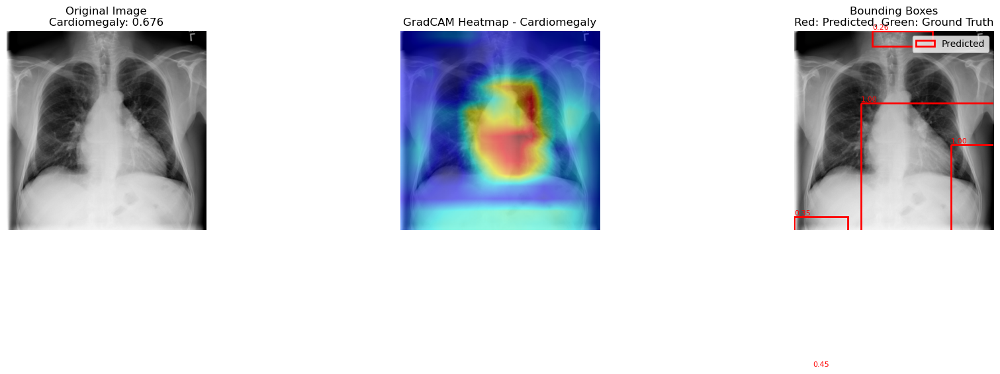

  0%|          | 1/112120 [00:01<57:07:15,  1.83s/it]

Visualization saved: gradcam_bbox_results/00000001_001_Cardiomegaly_gradcam.png


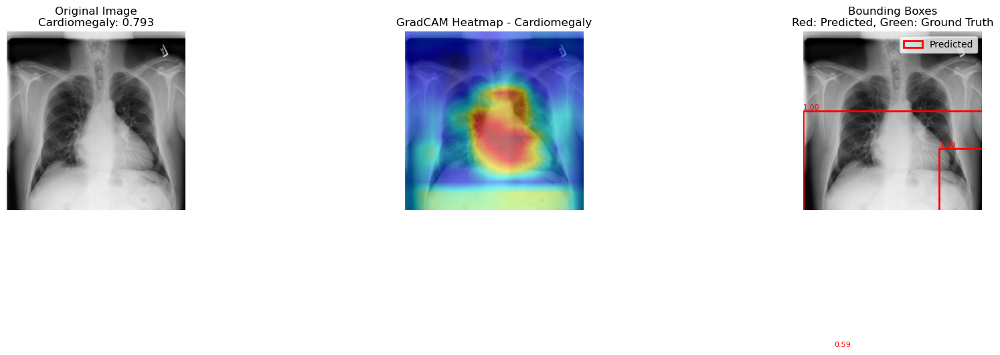

Visualization saved: gradcam_bbox_results/00000001_001_Emphysema_gradcam.png


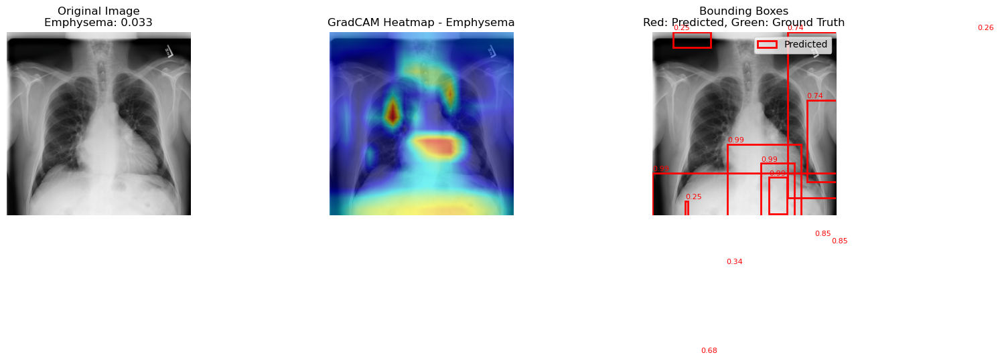

  0%|          | 2/112120 [00:03<58:10:39,  1.87s/it]

Visualization saved: gradcam_bbox_results/00000001_002_Cardiomegaly_gradcam.png


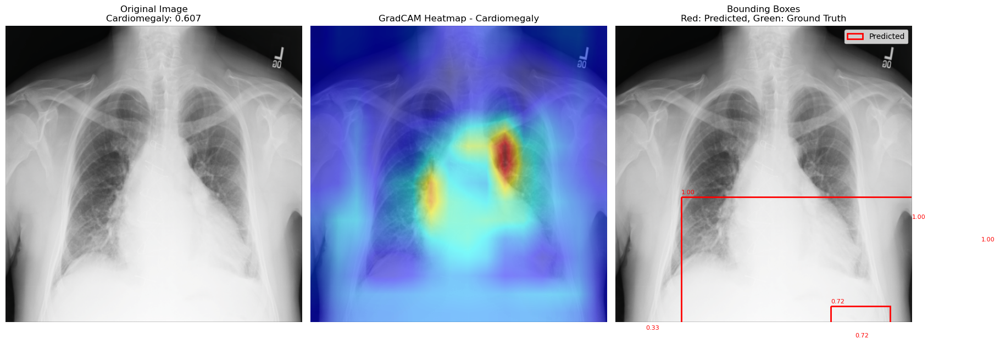

Visualization saved: gradcam_bbox_results/00000001_002_Effusion_gradcam.png


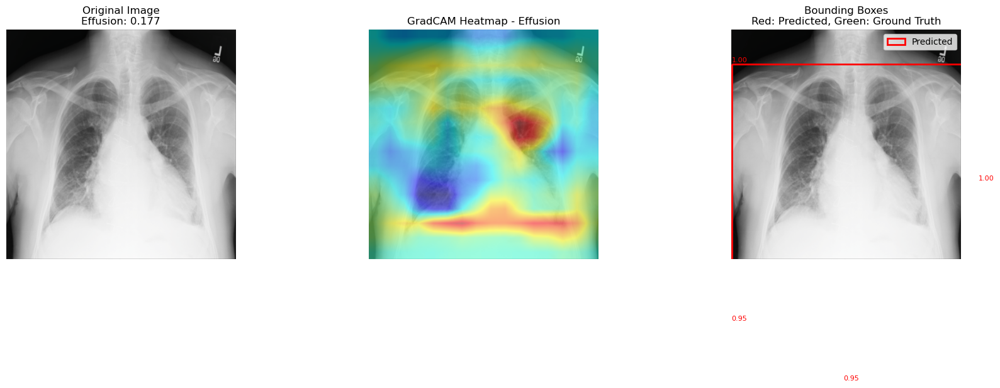

  0%|          | 3/112120 [00:06<66:43:26,  2.14s/it]

Visualization saved: gradcam_bbox_results/00000003_000_Hernia_gradcam.png


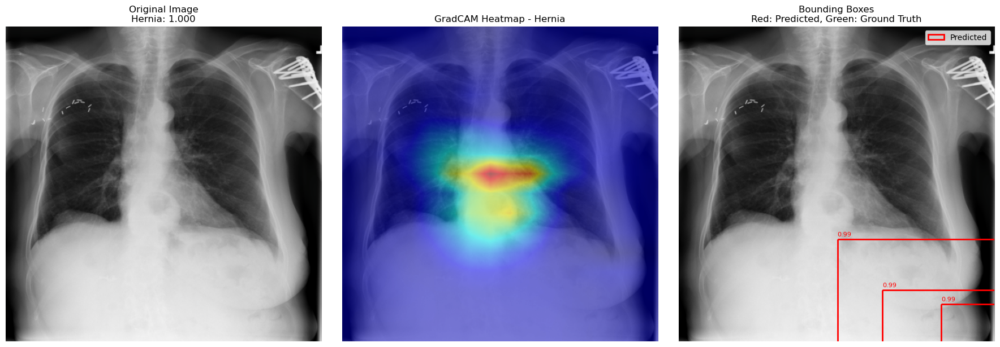

  0%|          | 5/112120 [00:07<39:35:21,  1.27s/it]

Visualization saved: gradcam_bbox_results/00000003_001_Hernia_gradcam.png


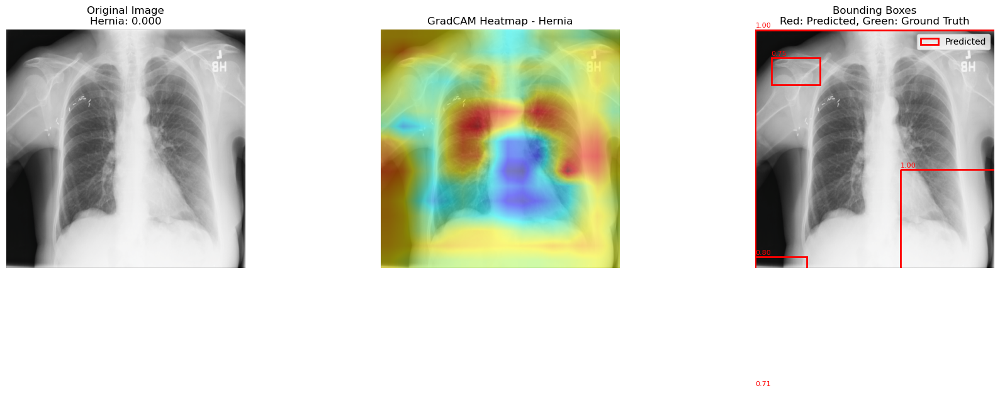

  0%|          | 6/112120 [00:08<40:58:03,  1.32s/it]

Visualization saved: gradcam_bbox_results/00000003_002_Hernia_gradcam.png


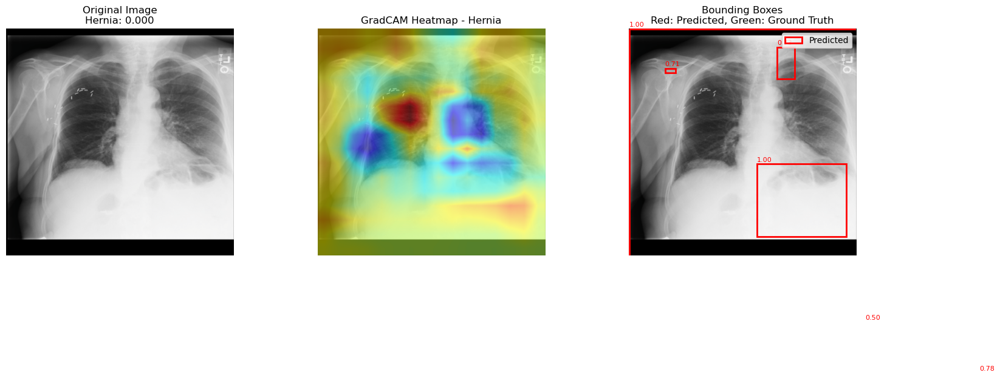

  0%|          | 7/112120 [00:10<41:18:34,  1.33s/it]

Visualization saved: gradcam_bbox_results/00000003_003_Infiltration_gradcam.png


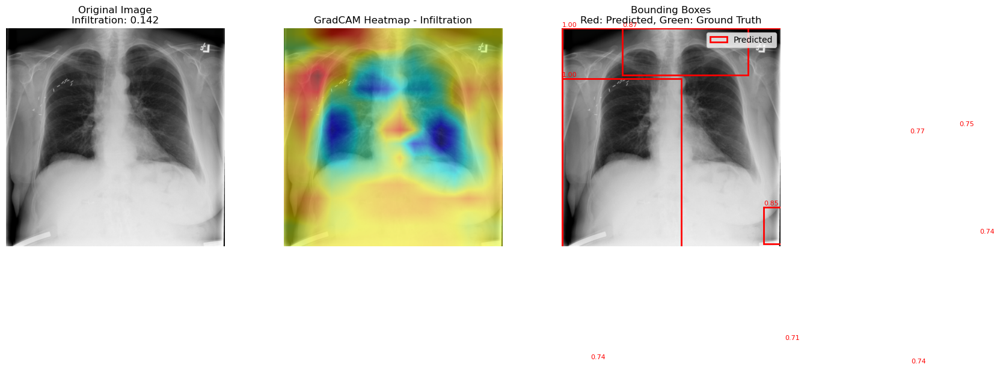

Visualization saved: gradcam_bbox_results/00000003_003_Hernia_gradcam.png


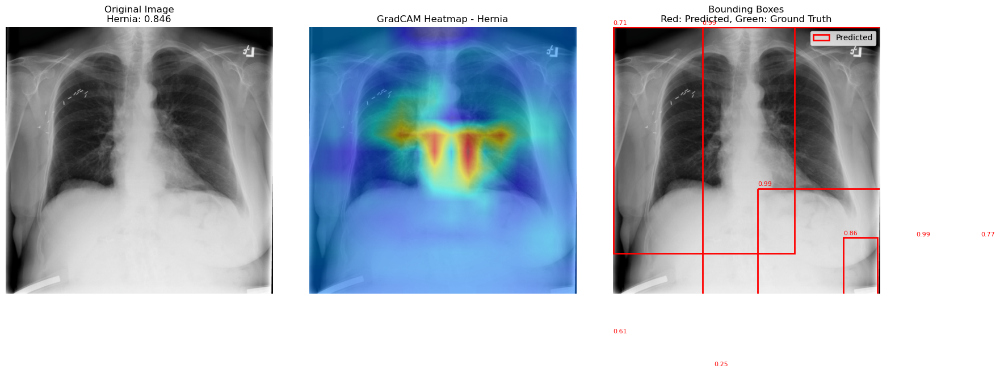

  0%|          | 8/112120 [00:13<62:56:49,  2.02s/it]

Visualization saved: gradcam_bbox_results/00000003_004_Hernia_gradcam.png


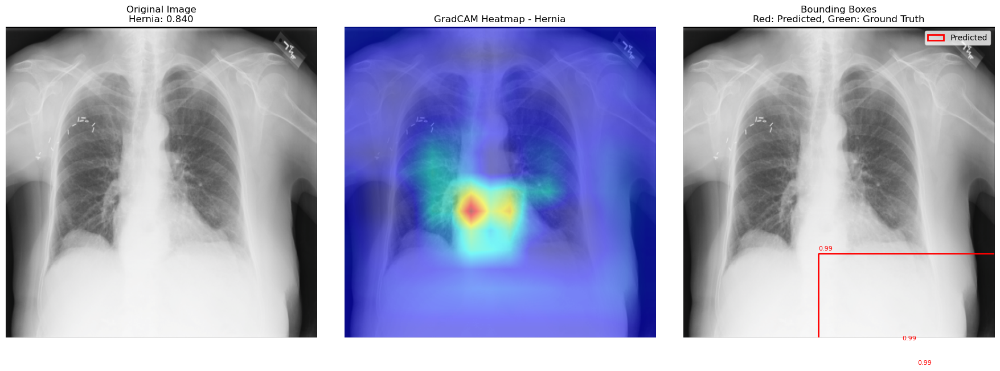

  0%|          | 9/112120 [00:15<57:01:38,  1.83s/it]

Visualization saved: gradcam_bbox_results/00000003_005_Hernia_gradcam.png


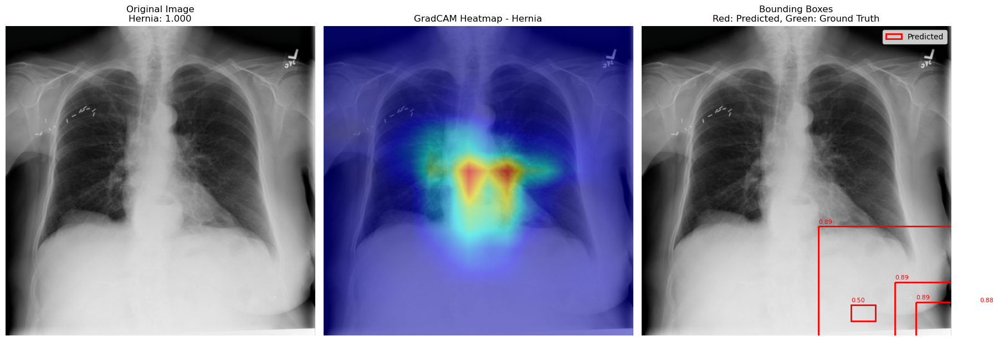

  0%|          | 10/112120 [00:16<52:18:57,  1.68s/it]

Visualization saved: gradcam_bbox_results/00000003_006_Hernia_gradcam.png


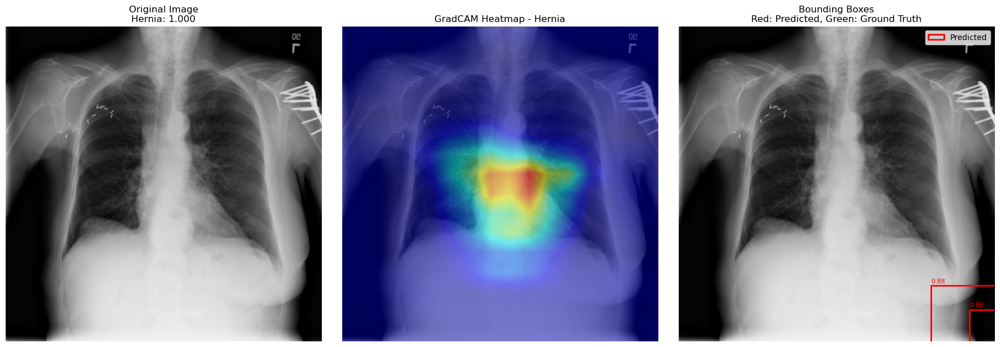

  0%|          | 11/112120 [00:18<52:41:23,  1.69s/it]

Visualization saved: gradcam_bbox_results/00000003_007_Hernia_gradcam.png


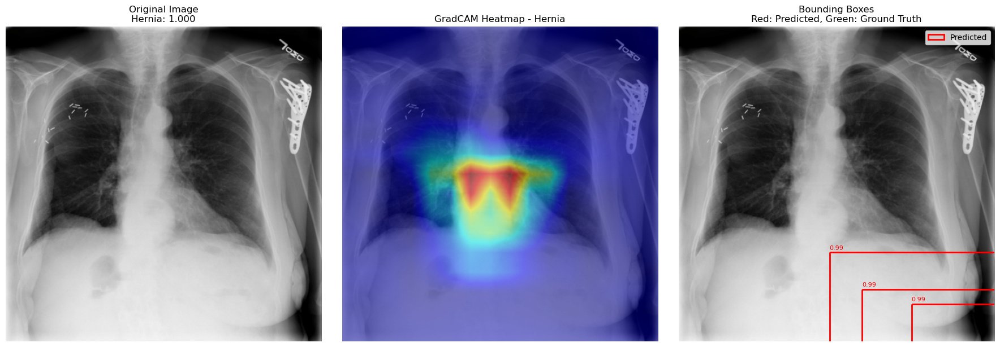

  0%|          | 12/112120 [00:19<48:03:43,  1.54s/it]

Visualization saved: gradcam_bbox_results/00000004_000_Mass_gradcam.png


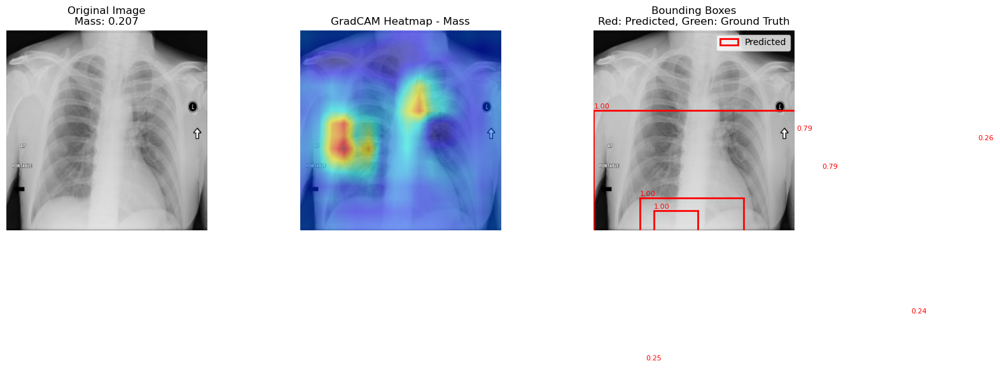

Visualization saved: gradcam_bbox_results/00000004_000_Nodule_gradcam.png


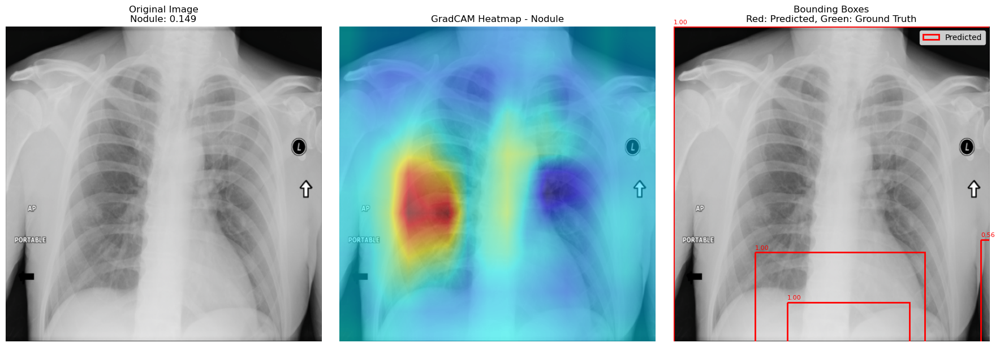

  0%|          | 13/112120 [00:21<54:50:08,  1.76s/it]

Visualization saved: gradcam_bbox_results/00000005_006_Infiltration_gradcam.png


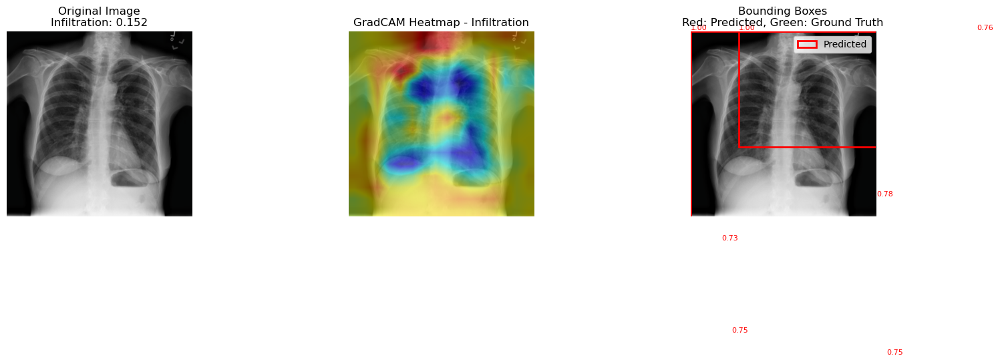

  0%|          | 20/112120 [00:23<36:29:40,  1.17s/it]


📊 Localization Results Summary:
Total evaluations: 17
Average Precision: 0.000
Average Recall: 0.000
Average F1-Score: 0.000
Visualizations saved in: gradcam_bbox_results
Results CSV: gradcam_bbox_results/localization_results.csv


In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import numpy as np
from PIL import Image
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import os
from tqdm import tqdm
import json

# Configuration
class Config:
    data_dir = "/data1/home/prakrutp/medical_imaging/dataset"
    csv_path = "/data1/home/prakrutp/medical_imaging/dataset/Data_Entry_2017.csv"
    bbox_csv_path = "/data1/home/prakrutp/medical_imaging/dataset/BBox_List_2017.csv"  # Update this path
    image_size = 512
    batch_size = 16
    num_classes = 14
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model_name = "tf_efficientnet_b3"
    checkpoint_dir = "checkpoints_efficientnet"
    
    # GradCAM parameters
    target_layer = "backbone.blocks.6"  # Last convolution layer for EfficientNet
    colormap = cv2.COLORMAP_JET
    
    # Bounding box parameters
    bbox_threshold = 0.5  # Threshold for heatmap to bbox conversion

# Dataset class with bounding box support
class ChestXrayDatasetWithBBox(Dataset):
    def __init__(self, csv_file, bbox_csv_file, base_dir, image_list=None, transform=None):
        self.df = pd.read_csv(csv_file)
        self.bbox_df = pd.read_csv(bbox_csv_file)
        self.base_dir = base_dir
        self.transform = transform
        
        self.disease_classes = [
            'Atelectasis', 'Cardiomegaly', 'Effusion', 'Infiltration', 
            'Mass', 'Nodule', 'Pneumonia', 'Pneumothorax', 
            'Consolidation', 'Edema', 'Emphysema', 'Fibrosis', 
            'Pleural_Thickening', 'Hernia'
        ]
        
        self._create_label_columns()
        
        if image_list is not None:
            self.data_frame = self.df[self.df['Image Index'].isin(image_list)].reset_index(drop=True)
        else:
            self.data_frame = self.df
        
        print(f"Dataset initialized with {len(self.data_frame)} images")
        print(f"Bounding box annotations: {len(self.bbox_df)}")
        
    def _create_label_columns(self):
        for disease in self.disease_classes:
            self.df.loc[:, disease] = self.df['Finding Labels'].apply(
                lambda x: 1 if disease in x else 0
            )
    
    def _find_image_path(self, img_name):
        for i in range(1, 13):
            folder_name = f"images_{i:03d}"
            possible_path = os.path.join(self.base_dir, folder_name, "images", img_name)
            if os.path.exists(possible_path):
                return possible_path
        return os.path.join(self.base_dir, "images_001", "images", img_name)
    
    def _get_bboxes_for_image(self, img_name):
        """Get all bounding boxes for a specific image"""
        bboxes = self.bbox_df[self.bbox_df['Image Index'] == img_name]
        bbox_data = []
        
        for _, row in bboxes.iterrows():
            try:
                # Parse bbox coordinates - adjust based on your CSV format
                if 'Bbox [x' in row.index:  # If bbox is in single column
                    bbox_str = row['Bbox [x	y	w	h]']
                    bbox_coords = [float(x) for x in bbox_str.split()]
                else:  # If bbox is in separate columns
                    bbox_coords = [
                        row['x'], row['y'], row['w'], row['h']
                    ]
                
                bbox_data.append({
                    'disease': row['Finding Label'],
                    'bbox': bbox_coords,
                    'class_idx': self.disease_classes.index(row['Finding Label'])
                })
            except Exception as e:
                print(f"Error parsing bbox for {img_name}: {e}")
                continue
        
        return bbox_data
    
    def __len__(self):
        return len(self.data_frame)
    
    def __getitem__(self, idx):
        img_name = self.data_frame.iloc[idx]['Image Index']
        img_path = self._find_image_path(img_name)
        
        try:
            image = Image.open(img_path).convert('RGB')
        except Exception as e:
            print(f"Warning: Could not load image {img_path}: {e}")
            image = Image.new('RGB', (Config.image_size, Config.image_size), color='black')
        
        labels = []
        for disease in self.disease_classes:
            labels.append(self.data_frame.iloc[idx][disease])
        
        # Get bounding boxes for this image
        bboxes = self._get_bboxes_for_image(img_name)
        
        if self.transform:
            image = self.transform(image)
            
        return image, torch.FloatTensor(labels), bboxes, img_name

# GradCAM implementation for EfficientNet
class GradCAM:
    def __init__(self, model, target_layer_name):
        self.model = model
        self.target_layer_name = target_layer_name
        self.gradients = None
        self.activations = None
        
        # Register hooks
        self._register_hooks()
    
    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output
            
        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0]
        
        # Find the target layer
        target_layer = None
        for name, module in self.model.named_modules():
            if name == self.target_layer_name:
                target_layer = module
                break
        
        if target_layer is None:
            raise ValueError(f"Target layer {self.target_layer_name} not found")
        
        target_layer.register_forward_hook(forward_hook)
        target_layer.register_backward_hook(backward_hook)
    
    def generate_heatmap(self, input_tensor, target_class=None):
        """Generate GradCAM heatmap for a specific class"""
        self.model.eval()
        
        # Forward pass
        output = self.model(input_tensor)
        
        if target_class is None:
            target_class = output.argmax(dim=1)
        
        # Zero gradients
        self.model.zero_grad()
        
        # Backward pass for target class
        one_hot = torch.zeros_like(output)
        one_hot[:, target_class] = 1
        
        output.backward(gradient=one_hot, retain_graph=True)
        
        # Get gradients and activations
        gradients = self.gradients.detach().cpu().numpy()[0]
        activations = self.activations.detach().cpu().numpy()[0]
        
        # Global average pooling of gradients
        weights = np.mean(gradients, axis=(1, 2))
        
        # Weighted combination of activation maps
        heatmap = np.zeros(activations.shape[1:])
        for i, w in enumerate(weights):
            heatmap += w * activations[i]
        
        # ReLU and normalization
        heatmap = np.maximum(heatmap, 0)
        heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)
        
        return heatmap, output

# Enhanced EfficientNet Model with feature extraction
class EfficientNetModelWithFeatures(nn.Module):
    def __init__(self, num_classes=14, model_name="tf_efficientnet_b3"):
        super(EfficientNetModelWithFeatures, self).__init__()
        import timm
        
        self.backbone = timm.create_model(
            model_name, 
            pretrained=False,
            num_classes=0,
            features_only=False
        )
        
        if "b3" in model_name:
            self.feature_dim = 1536
        else:
            self.feature_dim = self.backbone.num_features
        
        self.classifier = nn.Linear(self.feature_dim, num_classes)
        self.sigmoid = nn.Sigmoid()
        
        # Store intermediate features
        self.features = None
        
    def forward(self, x):
        features = self.backbone(x)
        self.features = features  # Store features for GradCAM
        output = self.classifier(features)
        output = self.sigmoid(output)
        return output

# Bounding Box Generator (as described in the paper)
class BoundingBoxGenerator:
    def __init__(self, threshold=0.5):
        self.threshold = threshold
    
    def heatmap_to_bboxes(self, heatmap, original_size=(1024, 1024), method="threshold"):
        """
        Convert heatmap to bounding boxes using thresholding method
        as described in the ChestX-ray8 paper
        """
        # Resize heatmap to original image size
        heatmap_resized = cv2.resize(heatmap, original_size)
        
        # Normalize to [0, 255]
        heatmap_normalized = (heatmap_resized * 255).astype(np.uint8)
        
        # Apply thresholding (as mentioned in the paper)
        bboxes = []
        
        if method == "threshold":
            # Try multiple thresholds as in the paper
            thresholds = [60, 120, 180]
            
            for threshold in thresholds:
                _, binary_map = cv2.threshold(heatmap_normalized, threshold, 255, cv2.THRESH_BINARY)
                
                # Find contours
                contours, _ = cv2.findContours(binary_map, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                
                for contour in contours:
                    if cv2.contourArea(contour) > 100:  # Minimum area filter
                        x, y, w, h = cv2.boundingRect(contour)
                        bboxes.append({
                            'bbox': [x, y, w, h],
                            'score': np.max(heatmap_resized[y:y+h, x:x+w]),
                            'threshold': threshold
                        })
        
        elif method == "adaptive":
            # Adaptive thresholding
            binary_map = cv2.adaptiveThreshold(
                heatmap_normalized, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                cv2.THRESH_BINARY, 11, 2
            )
            
            contours, _ = cv2.findContours(binary_map, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            
            for contour in contours:
                if cv2.contourArea(contour) > 100:
                    x, y, w, h = cv2.boundingRect(contour)
                    bboxes.append({
                        'bbox': [x, y, w, h],
                        'score': np.max(heatmap_resized[y:y+h, x:x+w])
                    })
        
        # Non-maximum suppression
        bboxes = self.non_max_suppression(bboxes)
        
        return bboxes
    
    def non_max_suppression(self, bboxes, iou_threshold=0.5):
        """Apply non-maximum suppression to remove overlapping boxes"""
        if len(bboxes) == 0:
            return []
        
        # Convert to numpy array for easier processing
        boxes_array = np.array([bbox['bbox'] for bbox in bboxes])
        scores = np.array([bbox['score'] for bbox in bboxes])
        
        # Get coordinates
        x1 = boxes_array[:, 0]
        y1 = boxes_array[:, 1]
        x2 = boxes_array[:, 0] + boxes_array[:, 2]
        y2 = boxes_array[:, 1] + boxes_array[:, 3]
        
        areas = (x2 - x1) * (y2 - y1)
        order = scores.argsort()[::-1]
        
        keep = []
        while order.size > 0:
            i = order[0]
            keep.append(i)
            
            xx1 = np.maximum(x1[i], x1[order[1:]])
            yy1 = np.maximum(y1[i], y1[order[1:]])
            xx2 = np.minimum(x2[i], x2[order[1:]])
            yy2 = np.minimum(y2[i], y2[order[1:]])
            
            w = np.maximum(0.0, xx2 - xx1)
            h = np.maximum(0.0, yy2 - yy1)
            intersection = w * h
            
            iou = intersection / (areas[i] + areas[order[1:]] - intersection)
            
            inds = np.where(iou <= iou_threshold)[0]
            order = order[inds + 1]
        
        return [bboxes[i] for i in keep]

# Visualization functions
def visualize_gradcam_with_bboxes(image, heatmap, bboxes_pred, bboxes_gt, 
                                 disease_class, prediction_score, 
                                 save_path=None, alpha=0.5):
    """Visualize GradCAM heatmap with predicted and ground truth bounding boxes"""
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Convert tensor to numpy for visualization
    if torch.is_tensor(image):
        image_np = image.permute(1, 2, 0).cpu().numpy()
        # Denormalize
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image_np = std * image_np + mean
        image_np = np.clip(image_np, 0, 1)
    else:
        image_np = image
    
    # Original image
    axes[0].imshow(image_np, cmap='gray')
    axes[0].set_title(f'Original Image\n{disease_class}: {prediction_score:.3f}')
    axes[0].axis('off')
    
    # Heatmap overlay
    heatmap_resized = cv2.resize(heatmap, (image_np.shape[1], image_np.shape[0]))
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), Config.colormap)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    
    overlayed_image = cv2.addWeighted(
        np.uint8(255 * image_np), 1 - alpha, 
        heatmap_colored, alpha, 0
    )
    
    axes[1].imshow(overlayed_image)
    axes[1].set_title(f'GradCAM Heatmap - {disease_class}')
    axes[1].axis('off')
    
    # Bounding boxes visualization
    axes[2].imshow(image_np, cmap='gray')
    
    # Draw predicted bounding boxes (red)
    for bbox in bboxes_pred:
        x, y, w, h = bbox['bbox']
        rect = patches.Rectangle((x, y), w, h, linewidth=2, 
                               edgecolor='red', facecolor='none', label='Predicted')
        axes[2].add_patch(rect)
        axes[2].text(x, y-5, f"{bbox['score']:.2f}", color='red', fontsize=8)
    
    # Draw ground truth bounding boxes (green)
    for bbox in bboxes_gt:
        if bbox['disease'] == disease_class:
            x, y, w, h = bbox['bbox']
            rect = patches.Rectangle((x, y), w, h, linewidth=2, 
                                   edgecolor='green', facecolor='none', label='Ground Truth')
            axes[2].add_patch(rect)
    
    axes[2].set_title('Bounding Boxes\nRed: Predicted, Green: Ground Truth')
    axes[2].axis('off')
    
    # Add legend
    handles, labels = axes[2].get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    axes[2].legend(by_label.values(), by_label.keys(), loc='upper right')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Visualization saved: {save_path}")
    
    plt.show()

# Evaluation metrics for bounding boxes
def calculate_bbox_metrics(pred_bboxes, gt_bboxes, iou_threshold=0.5):
    """Calculate localization accuracy metrics"""
    if len(pred_bboxes) == 0 or len(gt_bboxes) == 0:
        return 0.0, 0.0, 0.0
    
    # Convert to numpy arrays
    pred_boxes = np.array([bbox['bbox'] for bbox in pred_bboxes])
    gt_boxes = np.array([bbox['bbox'] for bbox in gt_bboxes])
    
    # Calculate IoU matrix
    iou_matrix = calculate_iou_matrix(pred_boxes, gt_boxes)
    
    # Find matches
    matches = []
    for i in range(len(pred_boxes)):
        max_iou = np.max(iou_matrix[i])
        if max_iou >= iou_threshold:
            matches.append(max_iou)
    
    # Calculate metrics
    precision = len(matches) / len(pred_boxes) if len(pred_boxes) > 0 else 0
    recall = len(matches) / len(gt_boxes) if len(gt_boxes) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall + 1e-8)
    
    return precision, recall, f1

def calculate_iou_matrix(boxes1, boxes2):
    """Calculate IoU matrix between two sets of bounding boxes"""
    iou_matrix = np.zeros((len(boxes1), len(boxes2)))
    
    for i, box1 in enumerate(boxes1):
        for j, box2 in enumerate(boxes2):
            iou_matrix[i, j] = calculate_iou(box1, box2)
    
    return iou_matrix

def calculate_iou(box1, box2):
    """Calculate Intersection over Union between two bounding boxes"""
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2
    
    # Calculate coordinates
    x1_min, y1_min = x1, y1
    x1_max, y1_max = x1 + w1, y1 + h1
    x2_min, y2_min = x2, y2
    x2_max, y2_max = x2 + w2, y2 + h2
    
    # Calculate intersection
    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)
    
    inter_area = max(0, inter_x_max - inter_x_min) * max(0, inter_y_max - inter_y_min)
    
    # Calculate union
    area1 = w1 * h1
    area2 = w2 * h2
    union_area = area1 + area2 - inter_area
    
    return inter_area / union_area if union_area > 0 else 0

# Main testing function with GradCAM and bounding boxes
def test_with_gradcam_and_bboxes():
    print("🔍 Testing with GradCAM and Bounding Box Generation")
    
    # Load model
    model = EfficientNetModelWithFeatures(
        num_classes=Config.num_classes, 
        model_name=Config.model_name
    )
    model = model.to(Config.device)
    
    # Load trained weights
    checkpoint_path = os.path.join(Config.checkpoint_dir, "best_model.pth")
    if os.path.exists(checkpoint_path):
        checkpoint = torch.load(checkpoint_path, map_location=Config.device)
        model.load_state_dict(checkpoint['model_state_dict'])
        print(f"Loaded model from {checkpoint_path}")
    else:
        raise FileNotFoundError(f"Checkpoint not found: {checkpoint_path}")
    
    # Initialize GradCAM
    grad_cam = GradCAM(model, Config.target_layer)
    
    # Initialize bounding box generator
    bbox_generator = BoundingBoxGenerator(threshold=Config.bbox_threshold)
    
    # Create transforms
    test_transform = transforms.Compose([
        transforms.Resize((Config.image_size, Config.image_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                           std=[0.229, 0.224, 0.225])
    ])
    
    # Load dataset with bounding boxes
    dataset = ChestXrayDatasetWithBBox(
        csv_file=Config.csv_path,
        bbox_csv_file=Config.bbox_csv_path,
        base_dir=Config.data_dir,
        transform=test_transform
    )
    
    # Create data loader
    dataloader = DataLoader(dataset, batch_size=1, shuffle=False, num_workers=2)
    
    # Results storage
    results = []
    visualization_dir = "gradcam_bbox_results"
    os.makedirs(visualization_dir, exist_ok=True)
    
    print("Generating GradCAM visualizations and bounding boxes...")
    
    for batch_idx, (images, labels, bboxes_gt, img_names) in enumerate(tqdm(dataloader)):
        if batch_idx >= 20:  # Limit for demonstration
            break
            
        images = images.to(Config.device)
        img_name = img_names[0]
        
        # Generate heatmaps for each disease class present in the image
        for class_idx in range(Config.num_classes):
            if labels[0, class_idx] > 0.5:  # If disease is present
                disease_name = dataset.disease_classes[class_idx]
                
                # Generate GradCAM heatmap
                heatmap, predictions = grad_cam.generate_heatmap(
                    images, target_class=class_idx
                )
                
                prediction_score = predictions[0, class_idx].item()
                
                # Generate bounding boxes from heatmap
                bboxes_pred = bbox_generator.heatmap_to_bboxes(
                    heatmap, original_size=(1024, 1024)
                )
                
                # Filter bboxes by disease class for ground truth
                gt_bboxes_for_class = [bbox for bbox in bboxes_gt if bbox['disease'] == disease_name]
                
                # Calculate metrics
                precision, recall, f1 = calculate_bbox_metrics(
                    bboxes_pred, gt_bboxes_for_class
                )
                
                # Store results
                results.append({
                    'image_name': img_name,
                    'disease': disease_name,
                    'prediction_score': prediction_score,
                    'num_pred_bboxes': len(bboxes_pred),
                    'num_gt_bboxes': len(gt_bboxes_for_class),
                    'precision': precision,
                    'recall': recall,
                    'f1_score': f1
                })
                
                # Create visualization
                if len(bboxes_pred) > 0 or len(gt_bboxes_for_class) > 0:
                    save_path = os.path.join(
                        visualization_dir, 
                        f"{img_name.split('.')[0]}_{disease_name}_gradcam.png"
                    )
                    
                    visualize_gradcam_with_bboxes(
                        images[0].cpu(), heatmap, bboxes_pred, bboxes_gt,
                        disease_name, prediction_score, save_path
                    )
    
    # Save results to CSV
    results_df = pd.DataFrame(results)
    results_csv_path = os.path.join(visualization_dir, "localization_results.csv")
    results_df.to_csv(results_csv_path, index=False)
    
    # Print summary statistics
    print("\n📊 Localization Results Summary:")
    print("=" * 50)
    if len(results) > 0:
        print(f"Total evaluations: {len(results)}")
        print(f"Average Precision: {results_df['precision'].mean():.3f}")
        print(f"Average Recall: {results_df['recall'].mean():.3f}")
        print(f"Average F1-Score: {results_df['f1_score'].mean():.3f}")
        print(f"Visualizations saved in: {visualization_dir}")
        print(f"Results CSV: {results_csv_path}")
    else:
        print("No results to display.")
    
    return results_df

# Batch processing for all test images
def batch_process_gradcam_bboxes():
    """Process all test images in batch mode"""
    print("🔄 Batch Processing GradCAM and Bounding Boxes")
    
    # Similar setup as above but without visualization for each image
    # This function would process all images and save aggregated results
    
    # Implementation would be similar to test_with_gradcam_and_bboxes()
    # but optimized for batch processing without individual visualizations
    
    pass

if __name__ == "__main__":
    # Run GradCAM and bounding box testing
    results = test_with_gradcam_and_bboxes()

🔍 Testing with GradCAM and SINGLE Bounding Box Generation
Using HIGH thresholds for focused regions


/tmp/ipykernel_230590/3787636864.py:575: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=Config.device)


Loaded model from checkpoints_efficientnet/best_model.pth
Dataset initialized with 112120 images
Bounding box annotations: 984
Generating GradCAM visualizations and SINGLE bounding boxes...


  0%|          | 0/112120 [00:00<?, ?it/s]/data1/home/prakrutp/miniconda3/envs/med_env_fixed/lib/python3.10/site-packages/torch/nn/modules/module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


Visualization saved: gradcam_single_bbox_results/00000001_000_Cardiomegaly_single_bbox.png


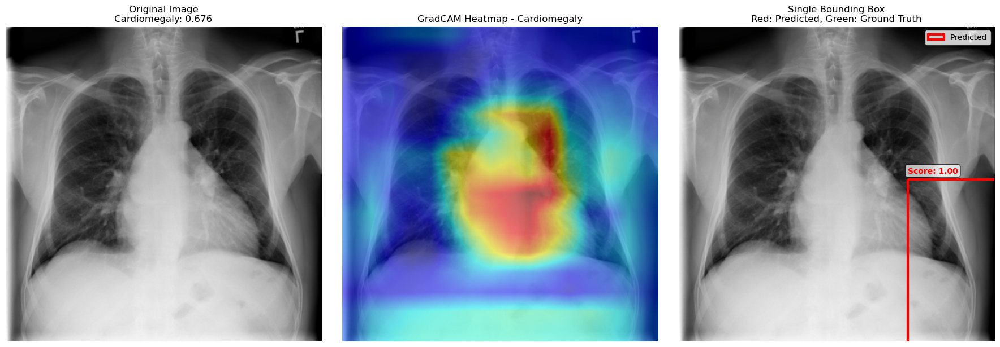

  0%|          | 1/112120 [00:02<66:21:10,  2.13s/it]

Visualization saved: gradcam_single_bbox_results/00000001_001_Cardiomegaly_single_bbox.png


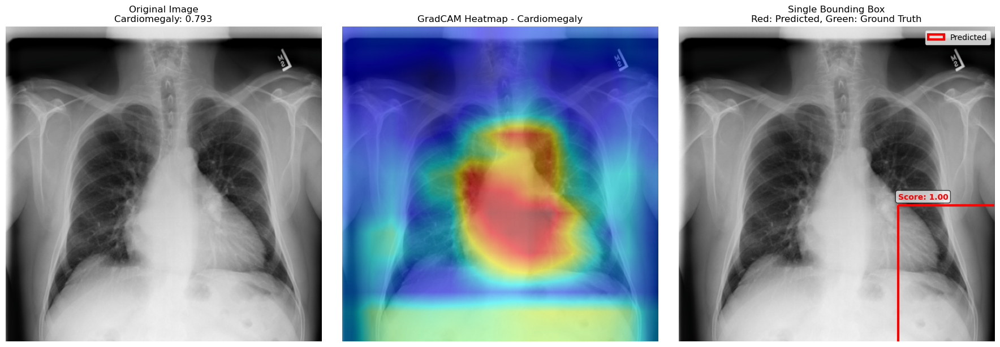

Visualization saved: gradcam_single_bbox_results/00000001_001_Emphysema_single_bbox.png


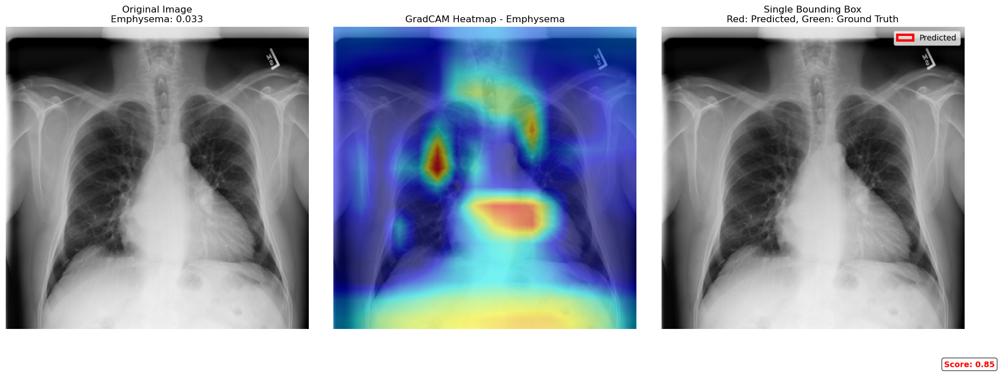

  0%|          | 2/112120 [00:05<84:02:03,  2.70s/it]

Visualization saved: gradcam_single_bbox_results/00000001_002_Cardiomegaly_single_bbox.png


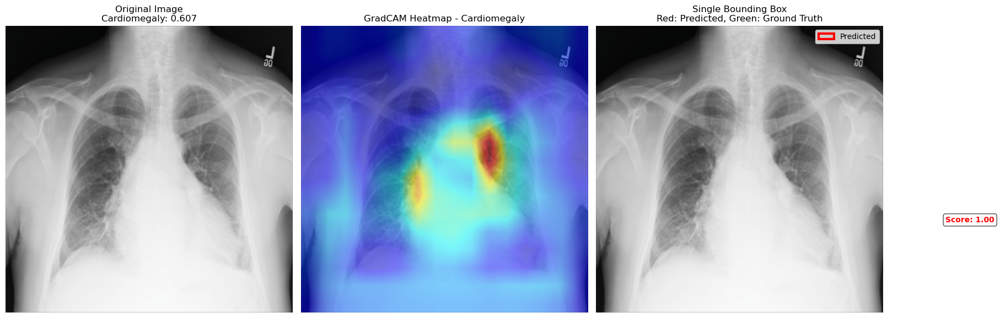

Visualization saved: gradcam_single_bbox_results/00000001_002_Effusion_single_bbox.png


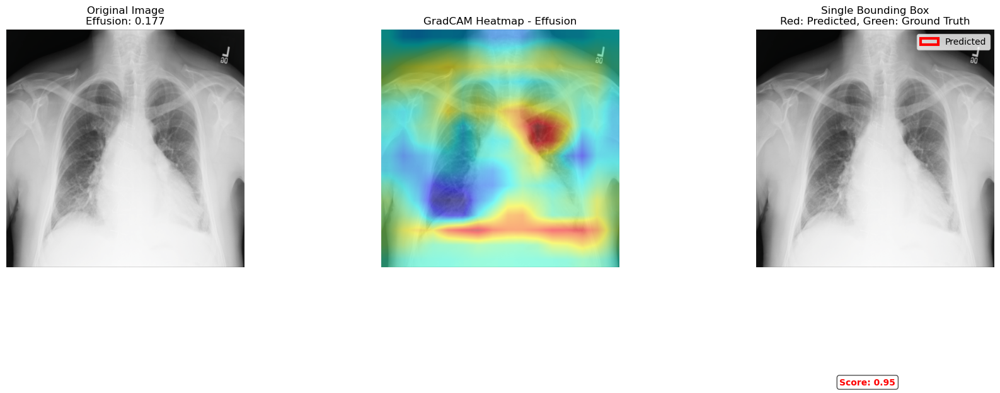

  0%|          | 3/112120 [00:07<81:55:58,  2.63s/it]

Visualization saved: gradcam_single_bbox_results/00000003_000_Hernia_single_bbox.png


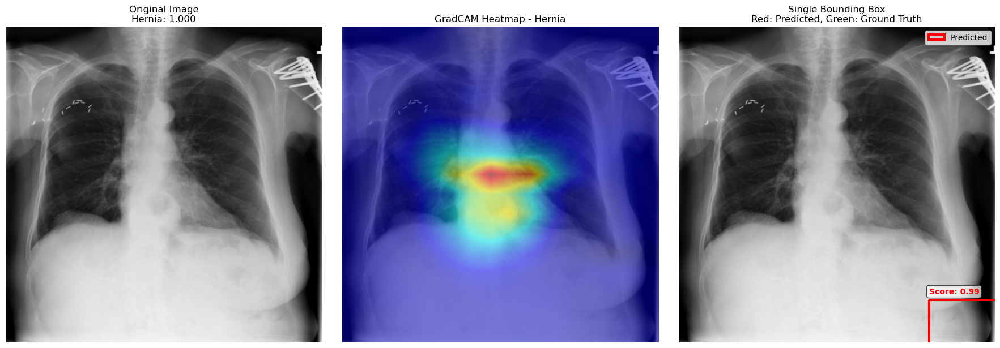

  0%|          | 5/112120 [00:09<48:56:54,  1.57s/it]

Visualization saved: gradcam_single_bbox_results/00000003_001_Hernia_single_bbox.png


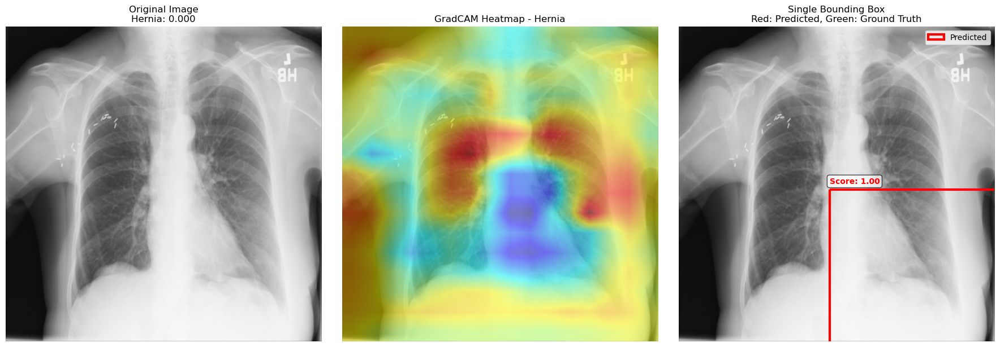

  0%|          | 6/112120 [00:10<46:16:07,  1.49s/it]

Visualization saved: gradcam_single_bbox_results/00000003_002_Hernia_single_bbox.png


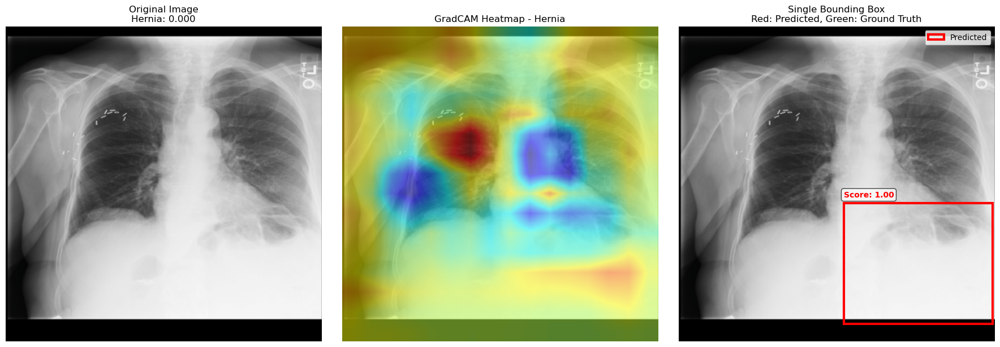

  0%|          | 7/112120 [00:11<44:02:32,  1.41s/it]

Visualization saved: gradcam_single_bbox_results/00000003_003_Infiltration_single_bbox.png


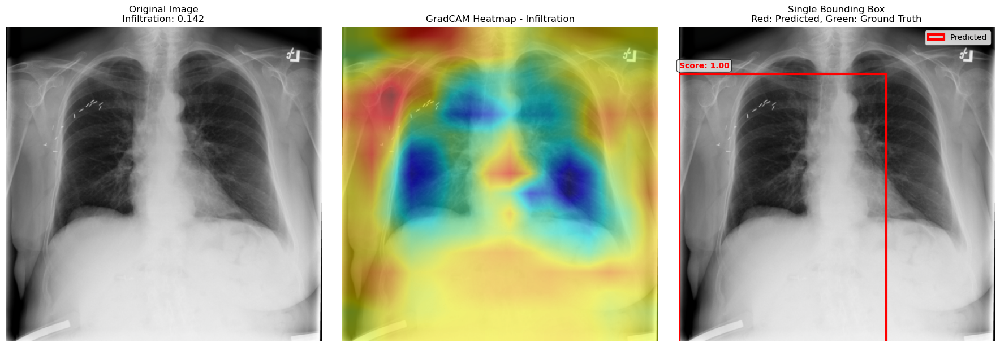

Visualization saved: gradcam_single_bbox_results/00000003_003_Hernia_single_bbox.png


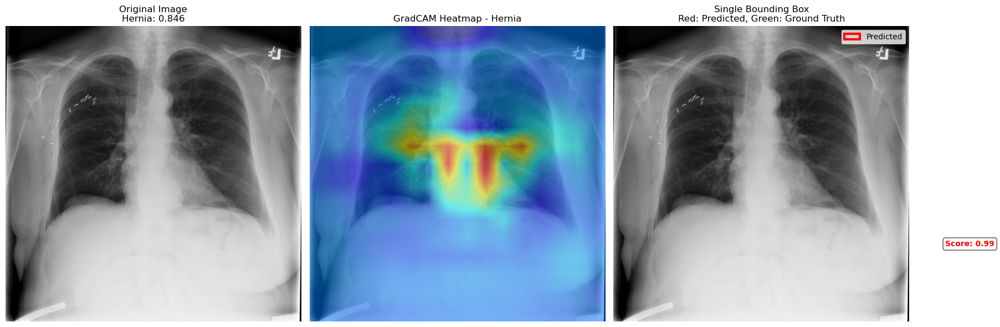

  0%|          | 8/112120 [00:14<54:19:37,  1.74s/it]

Visualization saved: gradcam_single_bbox_results/00000003_004_Hernia_single_bbox.png


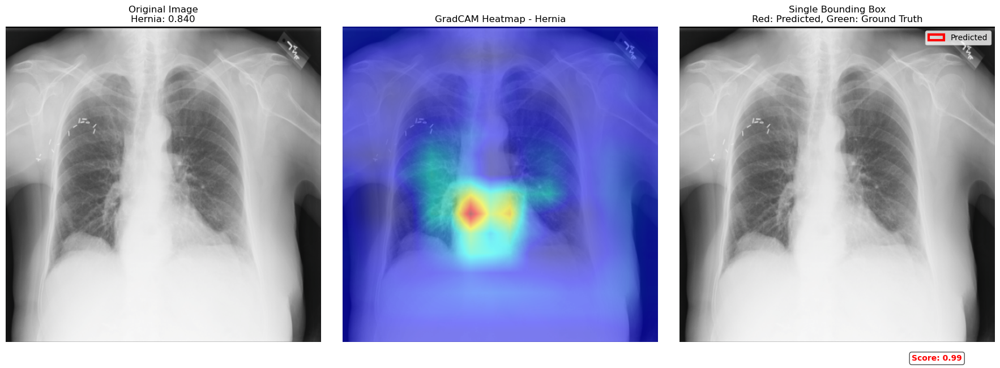

  0%|          | 9/112120 [00:15<49:35:30,  1.59s/it]

Visualization saved: gradcam_single_bbox_results/00000003_005_Hernia_single_bbox.png


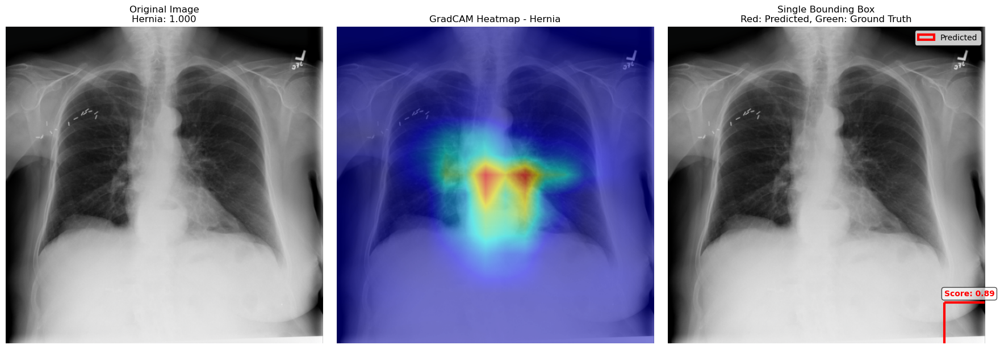

  0%|          | 10/112120 [00:16<46:12:20,  1.48s/it]

Visualization saved: gradcam_single_bbox_results/00000003_006_Hernia_single_bbox.png


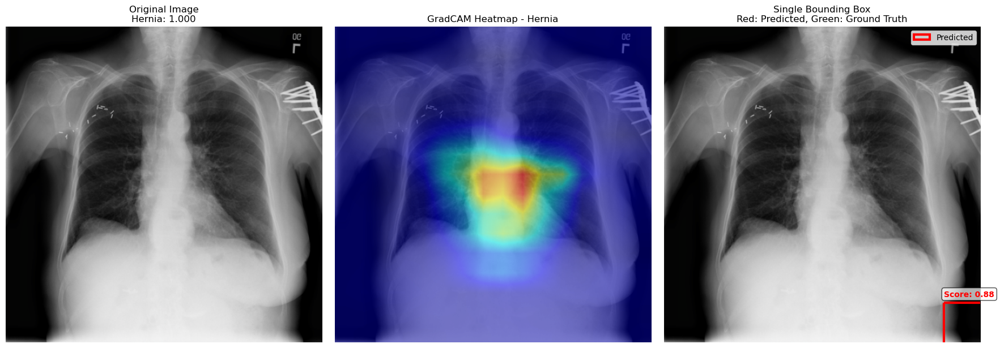

  0%|          | 11/112120 [00:18<43:46:05,  1.41s/it]

Visualization saved: gradcam_single_bbox_results/00000003_007_Hernia_single_bbox.png


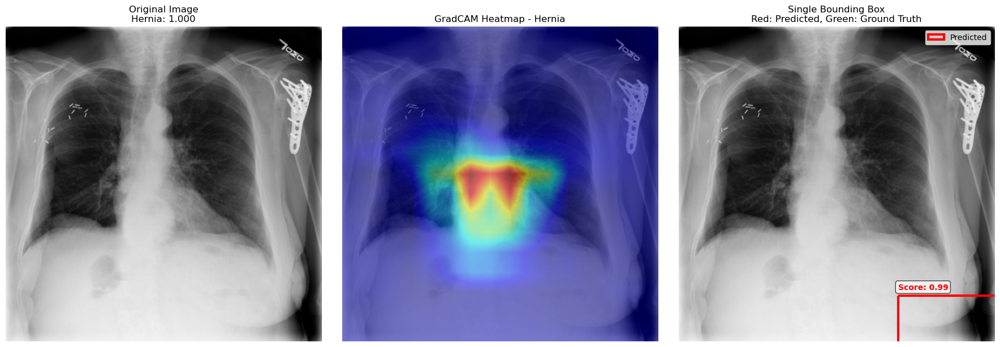

  0%|          | 12/112120 [00:19<42:14:45,  1.36s/it]

Visualization saved: gradcam_single_bbox_results/00000004_000_Mass_single_bbox.png


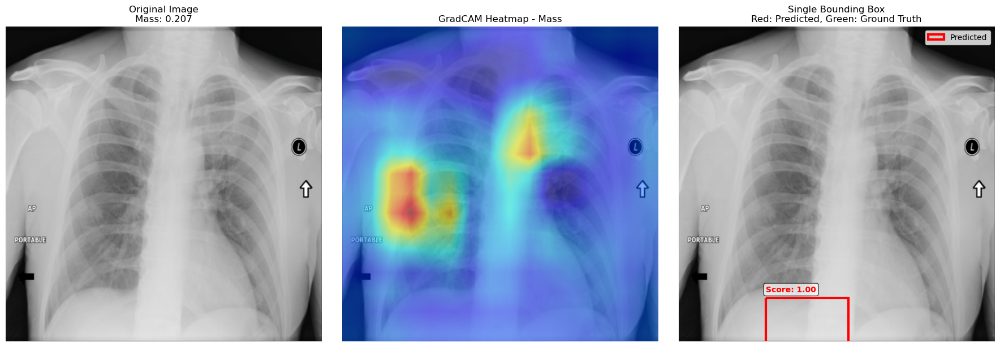

Visualization saved: gradcam_single_bbox_results/00000004_000_Nodule_single_bbox.png


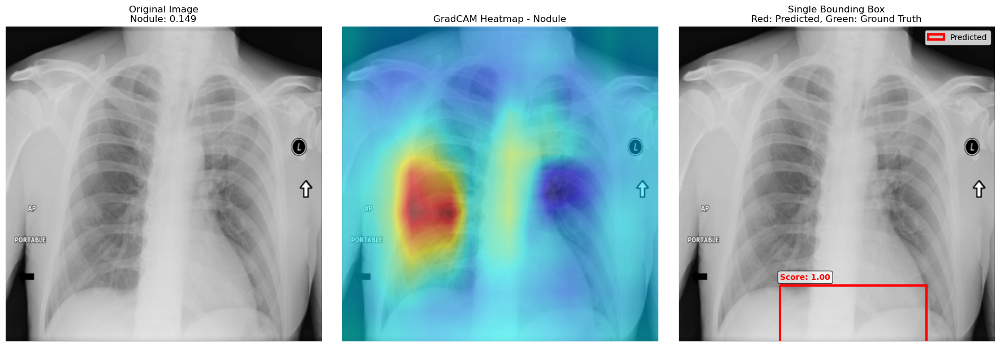

  0%|          | 13/112120 [00:21<52:27:16,  1.68s/it]

Visualization saved: gradcam_single_bbox_results/00000005_006_Infiltration_single_bbox.png


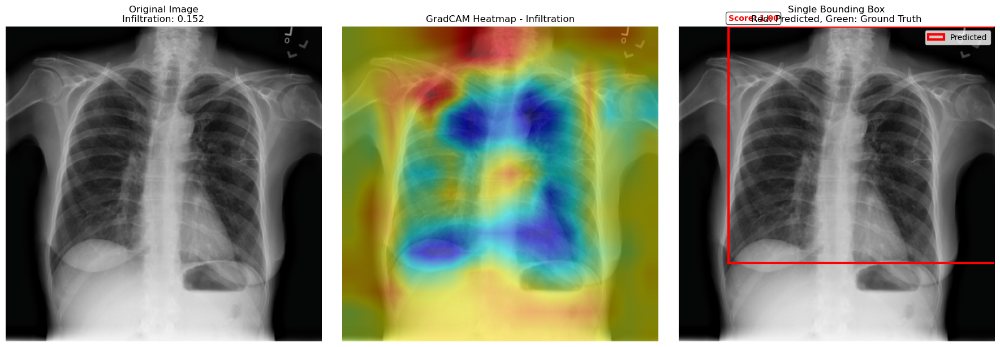

  0%|          | 20/112120 [00:23<36:02:49,  1.16s/it]


📊 SINGLE Bounding Box Localization Results Summary:
Total evaluations: 17
Successful single bbox detections: 17 (100.0%)
Average Precision: 0.000
Average Recall: 0.000
Average F1-Score: 0.000

Bounding Box Methods Used:
  fixed_threshold: 17 (100.0%)

Visualizations saved in: gradcam_single_bbox_results
Results CSV: gradcam_single_bbox_results/single_bbox_localization_results.csv


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import numpy as np
from PIL import Image
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import os
from tqdm import tqdm
import json

# Configuration
class Config:
    data_dir = "/data1/home/prakrutp/medical_imaging/dataset"
    csv_path = "/data1/home/prakrutp/medical_imaging/dataset/Data_Entry_2017.csv"
    bbox_csv_path = "/data1/home/prakrutp/medical_imaging/dataset/"  # Update this path
    image_size = 512
    batch_size = 16
    num_classes = 14
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model_name = "tf_efficientnet_b3"
    checkpoint_dir = "checkpoints_efficientnet"
    
    # GradCAM parameters
    target_layer = "backbone.blocks.6"  # Last convolution layer for EfficientNet
    colormap = cv2.COLORMAP_JET
    
    # Higher thresholds for more focused bounding boxes
    bbox_threshold_high = 0.7  # Higher threshold for more important regions
    bbox_threshold_medium = 0.5  # Medium threshold as fallback
    min_region_area = 500  # Minimum area for a valid region
    max_bbox_expansion = 1.2  # Maximum expansion factor for the final bbox

# Dataset class with bounding box support (same as before)
class ChestXrayDatasetWithBBox(Dataset):
    def __init__(self, csv_file, bbox_csv_file, base_dir, image_list=None, transform=None):
        self.df = pd.read_csv(csv_file)
        self.bbox_df = pd.read_csv(bbox_csv_file)
        self.base_dir = base_dir
        self.transform = transform
        
        self.disease_classes = [
            'Atelectasis', 'Cardiomegaly', 'Effusion', 'Infiltration', 
            'Mass', 'Nodule', 'Pneumonia', 'Pneumothorax', 
            'Consolidation', 'Edema', 'Emphysema', 'Fibrosis', 
            'Pleural_Thickening', 'Hernia'
        ]
        
        self._create_label_columns()
        
        if image_list is not None:
            self.data_frame = self.df[self.df['Image Index'].isin(image_list)].reset_index(drop=True)
        else:
            self.data_frame = self.df
        
        print(f"Dataset initialized with {len(self.data_frame)} images")
        print(f"Bounding box annotations: {len(self.bbox_df)}")
        
    def _create_label_columns(self):
        for disease in self.disease_classes:
            self.df.loc[:, disease] = self.df['Finding Labels'].apply(
                lambda x: 1 if disease in x else 0
            )
    
    def _find_image_path(self, img_name):
        for i in range(1, 13):
            folder_name = f"images_{i:03d}"
            possible_path = os.path.join(self.base_dir, folder_name, "images", img_name)
            if os.path.exists(possible_path):
                return possible_path
        return os.path.join(self.base_dir, "images_001", "images", img_name)
    
    def _get_bboxes_for_image(self, img_name):
        """Get all bounding boxes for a specific image"""
        bboxes = self.bbox_df[self.bbox_df['Image Index'] == img_name]
        bbox_data = []
        
        for _, row in bboxes.iterrows():
            try:
                # Parse bbox coordinates - adjust based on your CSV format
                if 'Bbox [x' in row.index:  # If bbox is in single column
                    bbox_str = row['Bbox [x	y	w	h]']
                    bbox_coords = [float(x) for x in bbox_str.split()]
                else:  # If bbox is in separate columns
                    bbox_coords = [
                        row['x'], row['y'], row['w'], row['h']
                    ]
                
                bbox_data.append({
                    'disease': row['Finding Label'],
                    'bbox': bbox_coords,
                    'class_idx': self.disease_classes.index(row['Finding Label'])
                })
            except Exception as e:
                print(f"Error parsing bbox for {img_name}: {e}")
                continue
        
        return bbox_data
    
    def __len__(self):
        return len(self.data_frame)
    
    def __getitem__(self, idx):
        img_name = self.data_frame.iloc[idx]['Image Index']
        img_path = self._find_image_path(img_name)
        
        try:
            image = Image.open(img_path).convert('RGB')
        except Exception as e:
            print(f"Warning: Could not load image {img_path}: {e}")
            image = Image.new('RGB', (Config.image_size, Config.image_size), color='black')
        
        labels = []
        for disease in self.disease_classes:
            labels.append(self.data_frame.iloc[idx][disease])
        
        # Get bounding boxes for this image
        bboxes = self._get_bboxes_for_image(img_name)
        
        if self.transform:
            image = self.transform(image)
            
        return image, torch.FloatTensor(labels), bboxes, img_name

# GradCAM implementation for EfficientNet (same as before)
class GradCAM:
    def __init__(self, model, target_layer_name):
        self.model = model
        self.target_layer_name = target_layer_name
        self.gradients = None
        self.activations = None
        
        # Register hooks
        self._register_hooks()
    
    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output
            
        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0]
        
        # Find the target layer
        target_layer = None
        for name, module in self.model.named_modules():
            if name == self.target_layer_name:
                target_layer = module
                break
        
        if target_layer is None:
            raise ValueError(f"Target layer {self.target_layer_name} not found")
        
        target_layer.register_forward_hook(forward_hook)
        target_layer.register_backward_hook(backward_hook)
    
    def generate_heatmap(self, input_tensor, target_class=None):
        """Generate GradCAM heatmap for a specific class"""
        self.model.eval()
        
        # Forward pass
        output = self.model(input_tensor)
        
        if target_class is None:
            target_class = output.argmax(dim=1)
        
        # Zero gradients
        self.model.zero_grad()
        
        # Backward pass for target class
        one_hot = torch.zeros_like(output)
        one_hot[:, target_class] = 1
        
        output.backward(gradient=one_hot, retain_graph=True)
        
        # Get gradients and activations
        gradients = self.gradients.detach().cpu().numpy()[0]
        activations = self.activations.detach().cpu().numpy()[0]
        
        # Global average pooling of gradients
        weights = np.mean(gradients, axis=(1, 2))
        
        # Weighted combination of activation maps
        heatmap = np.zeros(activations.shape[1:])
        for i, w in enumerate(weights):
            heatmap += w * activations[i]
        
        # ReLU and normalization
        heatmap = np.maximum(heatmap, 0)
        heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)
        
        return heatmap, output

# Enhanced EfficientNet Model with feature extraction (same as before)
class EfficientNetModelWithFeatures(nn.Module):
    def __init__(self, num_classes=14, model_name="tf_efficientnet_b3"):
        super(EfficientNetModelWithFeatures, self).__init__()
        import timm
        
        self.backbone = timm.create_model(
            model_name, 
            pretrained=False,
            num_classes=0,
            features_only=False
        )
        
        if "b3" in model_name:
            self.feature_dim = 1536
        else:
            self.feature_dim = self.backbone.num_features
        
        self.classifier = nn.Linear(self.feature_dim, num_classes)
        self.sigmoid = nn.Sigmoid()
        
        # Store intermediate features
        self.features = None
        
    def forward(self, x):
        features = self.backbone(x)
        self.features = features  # Store features for GradCAM
        output = self.classifier(features)
        output = self.sigmoid(output)
        return output

# Enhanced Bounding Box Generator with Single BBox and Higher Thresholds
class SingleBoundingBoxGenerator:
    def __init__(self, threshold_high=0.7, threshold_medium=0.5, min_area=500, max_expansion=1.2):
        self.threshold_high = threshold_high
        self.threshold_medium = threshold_medium
        self.min_area = min_area
        self.max_expansion = max_expansion
    
    def heatmap_to_single_bbox(self, heatmap, original_size=(1024, 1024)):
        """
        Convert heatmap to a SINGLE optimal bounding box using high thresholds
        Returns only the most important bounding box
        """
        # Resize heatmap to original image size
        heatmap_resized = cv2.resize(heatmap, original_size)
        
        # Normalize to [0, 255]
        heatmap_normalized = (heatmap_resized * 255).astype(np.uint8)
        
        # Try HIGH threshold first (more restrictive)
        bbox_high = self._get_single_bbox_with_threshold(heatmap_normalized, heatmap_resized, 
                                                        threshold_value=180)  # High threshold
        
        if bbox_high is not None:
            return [bbox_high]
        
        # If no bbox found with high threshold, try MEDIUM threshold
        bbox_medium = self._get_single_bbox_with_threshold(heatmap_normalized, heatmap_resized,
                                                          threshold_value=120)  # Medium threshold
        
        if bbox_medium is not None:
            return [bbox_medium]
        
        # If still no bbox, try with adaptive thresholding
        bbox_adaptive = self._get_single_bbox_adaptive(heatmap_normalized, heatmap_resized)
        
        if bbox_adaptive is not None:
            return [bbox_adaptive]
        
        # If no significant region found, return empty list
        return []
    
    def _get_single_bbox_with_threshold(self, heatmap_normalized, heatmap_resized, threshold_value):
        """Get single bounding box using fixed threshold"""
        # Apply threshold
        _, binary_map = cv2.threshold(heatmap_normalized, threshold_value, 255, cv2.THRESH_BINARY)
        
        # Find contours
        contours, _ = cv2.findContours(binary_map, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        if not contours:
            return None
        
        # Find the contour with maximum area and sufficient size
        valid_contours = []
        for contour in contours:
            area = cv2.contourArea(contour)
            if area >= self.min_area:
                valid_contours.append(contour)
        
        if not valid_contours:
            return None
        
        # Select the contour with maximum area (most significant region)
        largest_contour = max(valid_contours, key=cv2.contourArea)
        
        # Get bounding box
        x, y, w, h = cv2.boundingRect(largest_contour)
        
        # Calculate confidence score (average heatmap value in the region)
        region_heatmap = heatmap_resized[y:y+h, x:x+w]
        confidence = np.max(region_heatmap) if region_heatmap.size > 0 else 0
        
        # Apply slight expansion to capture context (but limit expansion)
        expanded_bbox = self._expand_bbox_slightly(x, y, w, h, heatmap_resized.shape)
        
        return {
            'bbox': expanded_bbox,
            'score': confidence,
            'threshold': threshold_value,
            'method': 'fixed_threshold'
        }
    
    def _get_single_bbox_adaptive(self, heatmap_normalized, heatmap_resized):
        """Get single bounding box using adaptive thresholding"""
        # Apply adaptive thresholding
        binary_map = cv2.adaptiveThreshold(
            heatmap_normalized, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
            cv2.THRESH_BINARY, 11, 8  # Higher C value for more conservative thresholding
        )
        
        # Find contours
        contours, _ = cv2.findContours(binary_map, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        if not contours:
            return None
        
        # Filter contours by area and find the most significant one
        valid_contours = []
        for contour in contours:
            area = cv2.contourArea(contour)
            if area >= self.min_area:
                valid_contours.append(contour)
        
        if not valid_contours:
            return None
        
        # Select contour with maximum area
        largest_contour = max(valid_contours, key=cv2.contourArea)
        
        # Get bounding box
        x, y, w, h = cv2.boundingRect(largest_contour)
        
        # Calculate confidence score
        region_heatmap = heatmap_resized[y:y+h, x:x+w]
        confidence = np.max(region_heatmap) if region_heatmap.size > 0 else 0
        
        # Apply slight expansion
        expanded_bbox = self._expand_bbox_slightly(x, y, w, h, heatmap_resized.shape)
        
        return {
            'bbox': expanded_bbox,
            'score': confidence,
            'threshold': 'adaptive',
            'method': 'adaptive_threshold'
        }
    
    def _expand_bbox_slightly(self, x, y, w, h, image_shape):
        """Expand bounding box slightly to capture context, but limit expansion"""
        img_height, img_width = image_shape
        
        # Calculate expansion factors (limited by max_expansion)
        expand_w = min(w * (self.max_expansion - 1), w * 0.3)  # Max 30% expansion
        expand_h = min(h * (self.max_expansion - 1), h * 0.3)
        
        # Apply expansion
        new_x = max(0, x - expand_w / 2)
        new_y = max(0, y - expand_h / 2)
        new_w = min(img_width - new_x, w + expand_w)
        new_h = min(img_height - new_y, h + expand_h)
        
        return [int(new_x), int(new_y), int(new_w), int(new_h)]
    
    def get_most_confident_region(self, heatmap, original_size=(1024, 1024)):
        """
        Alternative method: Find the single most confident region in the heatmap
        """
        heatmap_resized = cv2.resize(heatmap, original_size)
        
        # Find the location with maximum activation
        max_val = np.max(heatmap_resized)
        max_loc = np.unravel_index(np.argmax(heatmap_resized), heatmap_resized.shape)
        
        # If maximum value is too low, skip
        if max_val < 0.3:  # Minimum confidence threshold
            return []
        
        # Create a binary map around the maximum point
        binary_map = np.zeros_like(heatmap_resized, dtype=np.uint8)
        y_max, x_max = max_loc
        
        # Use region growing or fixed size around max point
        region_size = 100  # Fixed size for the most confident region
        half_size = region_size // 2
        
        x1 = max(0, x_max - half_size)
        y1 = max(0, y_max - half_size)
        x2 = min(heatmap_resized.shape[1], x_max + half_size)
        y2 = min(heatmap_resized.shape[0], y_max + half_size)
        
        w = x2 - x1
        h = y2 - y1
        
        # Ensure minimum size
        if w < 50 or h < 50:
            w = max(50, w)
            h = max(50, h)
            # Recalculate coordinates to maintain center
            x1 = max(0, x_max - w // 2)
            y1 = max(0, y_max - h // 2)
            x2 = min(heatmap_resized.shape[1], x1 + w)
            y2 = min(heatmap_resized.shape[0], y1 + h)
            w = x2 - x1
            h = y2 - y1
        
        bbox = [int(x1), int(y1), int(w), int(h)]
        
        return [{
            'bbox': bbox,
            'score': max_val,
            'threshold': 'max_confidence',
            'method': 'max_confidence'
        }]

# Visualization functions
def visualize_gradcam_with_single_bbox(image, heatmap, bboxes_pred, bboxes_gt, 
                                     disease_class, prediction_score, 
                                     save_path=None, alpha=0.5):
    """Visualize GradCAM heatmap with single predicted bounding box"""
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # Convert tensor to numpy for visualization
    if torch.is_tensor(image):
        image_np = image.permute(1, 2, 0).cpu().numpy()
        # Denormalize
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image_np = std * image_np + mean
        image_np = np.clip(image_np, 0, 1)
    else:
        image_np = image
    
    # Original image
    axes[0].imshow(image_np, cmap='gray')
    axes[0].set_title(f'Original Image\n{disease_class}: {prediction_score:.3f}')
    axes[0].axis('off')
    
    # Heatmap overlay
    heatmap_resized = cv2.resize(heatmap, (image_np.shape[1], image_np.shape[0]))
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), Config.colormap)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    
    overlayed_image = cv2.addWeighted(
        np.uint8(255 * image_np), 1 - alpha, 
        heatmap_colored, alpha, 0
    )
    
    axes[1].imshow(overlayed_image)
    axes[1].set_title(f'GradCAM Heatmap - {disease_class}')
    axes[1].axis('off')
    
    # SINGLE Bounding box visualization
    axes[2].imshow(image_np, cmap='gray')
    
    # Draw SINGLE predicted bounding box (red)
    if bboxes_pred:
        bbox = bboxes_pred[0]  # Only the first (and only) bbox
        x, y, w, h = bbox['bbox']
        rect = patches.Rectangle((x, y), w, h, linewidth=3, 
                               edgecolor='red', facecolor='none', label='Predicted')
        axes[2].add_patch(rect)
        axes[2].text(x, y-10, f"Score: {bbox['score']:.2f}", 
                    color='red', fontsize=10, fontweight='bold',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.7))
    
    # Draw ground truth bounding boxes (green) for this disease
    for bbox_gt in bboxes_gt:
        if bbox_gt['disease'] == disease_class:
            x, y, w, h = bbox_gt['bbox']
            rect = patches.Rectangle((x, y), w, h, linewidth=2, 
                                   edgecolor='green', facecolor='none', label='Ground Truth')
            axes[2].add_patch(rect)
    
    axes[2].set_title('Single Bounding Box\nRed: Predicted, Green: Ground Truth')
    axes[2].axis('off')
    
    # Add legend
    handles, labels = axes[2].get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    axes[2].legend(by_label.values(), by_label.keys(), loc='upper right')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Visualization saved: {save_path}")
    
    plt.show()

# Evaluation metrics for bounding boxes (same as before)
def calculate_bbox_metrics(pred_bboxes, gt_bboxes, iou_threshold=0.5):
    """Calculate localization accuracy metrics"""
    if len(pred_bboxes) == 0 or len(gt_bboxes) == 0:
        return 0.0, 0.0, 0.0
    
    # Convert to numpy arrays
    pred_boxes = np.array([bbox['bbox'] for bbox in pred_bboxes])
    gt_boxes = np.array([bbox['bbox'] for bbox in gt_bboxes])
    
    # Calculate IoU matrix
    iou_matrix = calculate_iou_matrix(pred_boxes, gt_boxes)
    
    # Find matches
    matches = []
    for i in range(len(pred_boxes)):
        max_iou = np.max(iou_matrix[i])
        if max_iou >= iou_threshold:
            matches.append(max_iou)
    
    # Calculate metrics
    precision = len(matches) / len(pred_boxes) if len(pred_boxes) > 0 else 0
    recall = len(matches) / len(gt_boxes) if len(gt_boxes) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall + 1e-8)
    
    return precision, recall, f1

def calculate_iou_matrix(boxes1, boxes2):
    """Calculate IoU matrix between two sets of bounding boxes"""
    iou_matrix = np.zeros((len(boxes1), len(boxes2)))
    
    for i, box1 in enumerate(boxes1):
        for j, box2 in enumerate(boxes2):
            iou_matrix[i, j] = calculate_iou(box1, box2)
    
    return iou_matrix

def calculate_iou(box1, box2):
    """Calculate Intersection over Union between two bounding boxes"""
    x1, y1, w1, h1 = box1
    x2, y2, w2, h2 = box2
    
    # Calculate coordinates
    x1_min, y1_min = x1, y1
    x1_max, y1_max = x1 + w1, y1 + h1
    x2_min, y2_min = x2, y2
    x2_max, y2_max = x2 + w2, y2 + h2
    
    # Calculate intersection
    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)
    
    inter_area = max(0, inter_x_max - inter_x_min) * max(0, inter_y_max - inter_y_min)
    
    # Calculate union
    area1 = w1 * h1
    area2 = w2 * h2
    union_area = area1 + area2 - inter_area
    
    return inter_area / union_area if union_area > 0 else 0

# Main testing function with Single Bounding Box
def test_with_gradcam_and_single_bbox():
    print("🔍 Testing with GradCAM and SINGLE Bounding Box Generation")
    print("Using HIGH thresholds for focused regions")
    
    # Load model
    model = EfficientNetModelWithFeatures(
        num_classes=Config.num_classes, 
        model_name=Config.model_name
    )
    model = model.to(Config.device)
    
    # Load trained weights
    checkpoint_path = os.path.join(Config.checkpoint_dir, "best_model.pth")
    if os.path.exists(checkpoint_path):
        checkpoint = torch.load(checkpoint_path, map_location=Config.device)
        model.load_state_dict(checkpoint['model_state_dict'])
        print(f"Loaded model from {checkpoint_path}")
    else:
        raise FileNotFoundError(f"Checkpoint not found: {checkpoint_path}")
    
    # Initialize GradCAM
    grad_cam = GradCAM(model, Config.target_layer)
    
    # Initialize SINGLE bounding box generator with high thresholds
    bbox_generator = SingleBoundingBoxGenerator(
        threshold_high=Config.bbox_threshold_high,
        threshold_medium=Config.bbox_threshold_medium,
        min_area=Config.min_region_area,
        max_expansion=Config.max_bbox_expansion
    )
    
    # Create transforms
    test_transform = transforms.Compose([
        transforms.Resize((Config.image_size, Config.image_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                           std=[0.229, 0.224, 0.225])
    ])
    
    # Load dataset with bounding boxes
    dataset = ChestXrayDatasetWithBBox(
        csv_file=Config.csv_path,
        bbox_csv_file=Config.bbox_csv_path,
        base_dir=Config.data_dir,
        transform=test_transform
    )
    
    # Create data loader
    dataloader = DataLoader(dataset, batch_size=1, shuffle=False, num_workers=2)
    
    # Results storage
    results = []
    visualization_dir = "gradcam_single_bbox_results"
    os.makedirs(visualization_dir, exist_ok=True)
    
    print("Generating GradCAM visualizations and SINGLE bounding boxes...")
    
    for batch_idx, (images, labels, bboxes_gt, img_names) in enumerate(tqdm(dataloader)):
        if batch_idx >= 20:  # Limit for demonstration
            break
            
        images = images.to(Config.device)
        img_name = img_names[0]
        
        # Generate heatmaps for each disease class present in the image
        for class_idx in range(Config.num_classes):
            if labels[0, class_idx] > 0.5:  # If disease is present
                disease_name = dataset.disease_classes[class_idx]
                
                # Generate GradCAM heatmap
                heatmap, predictions = grad_cam.generate_heatmap(
                    images, target_class=class_idx
                )
                
                prediction_score = predictions[0, class_idx].item()
                
                # Generate SINGLE bounding box from heatmap
                bboxes_pred = bbox_generator.heatmap_to_single_bbox(
                    heatmap, original_size=(1024, 1024)
                )
                
                # If no bbox found with threshold method, try max confidence method
                if not bboxes_pred:
                    bboxes_pred = bbox_generator.get_most_confident_region(
                        heatmap, original_size=(1024, 1024)
                    )
                
                # Filter bboxes by disease class for ground truth
                gt_bboxes_for_class = [bbox for bbox in bboxes_gt if bbox['disease'] == disease_name]
                
                # Calculate metrics
                precision, recall, f1 = calculate_bbox_metrics(
                    bboxes_pred, gt_bboxes_for_class
                )
                
                # Store results
                results.append({
                    'image_name': img_name,
                    'disease': disease_name,
                    'prediction_score': prediction_score,
                    'num_pred_bboxes': len(bboxes_pred),
                    'num_gt_bboxes': len(gt_bboxes_for_class),
                    'precision': precision,
                    'recall': recall,
                    'f1_score': f1,
                    'bbox_method': bboxes_pred[0]['method'] if bboxes_pred else 'none'
                })
                
                # Create visualization only if we found a bounding box
                if bboxes_pred:
                    save_path = os.path.join(
                        visualization_dir, 
                        f"{img_name.split('.')[0]}_{disease_name}_single_bbox.png"
                    )
                    
                    visualize_gradcam_with_single_bbox(
                        images[0].cpu(), heatmap, bboxes_pred, bboxes_gt,
                        disease_name, prediction_score, save_path
                    )
    
    # Save results to CSV
    results_df = pd.DataFrame(results)
    results_csv_path = os.path.join(visualization_dir, "single_bbox_localization_results.csv")
    results_df.to_csv(results_csv_path, index=False)
    
    # Print summary statistics
    print("\n📊 SINGLE Bounding Box Localization Results Summary:")
    print("=" * 60)
    if len(results) > 0:
        successful_detections = len(results_df[results_df['num_pred_bboxes'] > 0])
        total_evaluations = len(results_df)
        
        print(f"Total evaluations: {total_evaluations}")
        print(f"Successful single bbox detections: {successful_detections} ({successful_detections/total_evaluations*100:.1f}%)")
        print(f"Average Precision: {results_df['precision'].mean():.3f}")
        print(f"Average Recall: {results_df['recall'].mean():.3f}")
        print(f"Average F1-Score: {results_df['f1_score'].mean():.3f}")
        
        # Print method distribution
        method_counts = results_df['bbox_method'].value_counts()
        print("\nBounding Box Methods Used:")
        for method, count in method_counts.items():
            print(f"  {method}: {count} ({count/total_evaluations*100:.1f}%)")
        
        print(f"\nVisualizations saved in: {visualization_dir}")
        print(f"Results CSV: {results_csv_path}")
    else:
        print("No results to display.")
    
    return results_df

if __name__ == "__main__":
    # Run GradCAM and single bounding box testing
    results = test_with_gradcam_and_single_bbox()